In [ ]:
from pathlib import Path
import os

DAY = "20251201"
Version = "v1"

PROJECT_ROOT = Path(os.getenv("LLMSC_ROOT", ".")).resolve()

DATA_DIR = Path(os.getenv("LLMSC_DATA_DIR", PROJECT_ROOT / "input")).resolve()
OUT_DIR  = Path(os.getenv("LLMSC_OUT_DIR",  PROJECT_ROOT / "runs" / f"{DAY}.{Version}")).resolve()
OUT_DIR.mkdir(parents=True, exist_ok=True)

In [ ]:
RANDOM_SEED = 42
import random, os
import numpy as np
random.seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print(f"🔒 Random seed set to {RANDOM_SEED} for reproducibility.")

🔒 Random seed set to 42 for reproducibility.


In [ ]:
import os
GEMINI_API_KEY = os.getenv("GEMINI_API_KEY", "")
USE_LLM = bool(GEMINI_API_KEY)

if not USE_LLM:
    print("⚠️ GEMINI_API_KEY not set → LLM inference cells will be skipped.")

In [ ]:
import google.generativeai as genai
import scanpy as sc
import pandas as pd
import numpy as np
import scipy
import scipy.sparse
import adjustText
import gc
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from sklearn.metrics import confusion_matrix


import logging
logging.basicConfig(
    level=logging.INFO,
    format="%(levelname)s:%(name)s:%(message)s"
)

from llm_sc_curator import LLMscCurator
from llm_sc_curator.masking import FeatureDistiller


import warnings
warnings.filterwarnings("ignore")

In [ ]:
# ==========================================
# 1. API
# ==========================================

genai.configure(api_key=GEMINI_API_KEY)
print("--- Available Models for your Key ---")
try:
    for m in genai.list_models():
        if 'generateContent' in m.supported_generation_methods:
            print(m.name)
except Exception as e:
    print(f"Error: {e}")

--- Available Models for your Key ---
models/gemini-2.5-flash
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-exp-image-generation
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-exp-1206
models/gemini-2.5-flash-preview-tts
models/gemini-2.5-pro-preview-tts
models/gemma-3-1b-it
models/gemma-3-4b-it
models/gemma-3-12b-it
models/gemma-3-27b-it
models/gemma-3n-e4b-it
models/gemma-3n-e2b-it
models/gemini-flash-latest
models/gemini-flash-lite-latest
models/gemini-pro-latest
models/gemini-2.5-flash-lite
models/gemini-2.5-flash-image-preview
models/gemini-2.5-flash-image
models/gemini-2.5-flash-preview-09-2025
models/gemini-2.5-flash-lite-preview-09-2025
models/gemini-3-pro-preview
models/gemini-3-pro-image-preview
models/nano-banana-pro-preview
models/gemini-robotics-er-1.5-preview
models/gemini-2.5-computer-

In [ ]:
MODEL_NAME = 'models/gemini-2.5-pro'

# MODEL_NAME = 'models/gemini-3-pro-preview'
# MODEL_NAME = 'models/gemini-2.5-flash'
# MODEL_NAME = 'models/gemini-2.0-flash'

print(f"Using Model: {MODEL_NAME}")
model = genai.GenerativeModel(MODEL_NAME)

Using Model: models/gemini-2.5-pro


In [ ]:
%load_ext rpy2.ipython

In [ ]:
%R -i OUT_DIR

In [ ]:
%%R
library(dplyr)
library(tidyr)
library(grid)
library(scran)
library(igraph)
library(scater)
library(arrow)
library(scuttle)
library(SingleR)
library(ggplot2)
library(patchwork)
library(pheatmap)
library(OSTA.data)
library(scrapper)
library(BiocParallel)
library(DropletUtils)
library(SpatialExperiment)
library(SpatialExperimentIO)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: ‘matrixStats’

The following object is masked from ‘package:dplyr’:

    count


Attaching package: ‘MatrixGenerics’

The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeighte

In [ ]:
# ==========================================
# 2. Load Xenium Data
# ==========================================
%%R
# retrieve dataset from OSF repository
id <- "Xenium_HumanColon_Oliveira"
pa <- OSTA.data_load(id, mol=FALSE)
dir.create(td <- tempfile())
unzip(pa, exdir=td)
(spe <- readXeniumSXE(td, addTx=FALSE))

/root/.cache/R/BiocFileCache
  does not exist, create directory? (yes/no): yes
class: SpatialExperiment 
dim: 422 340837 
metadata(3): experiment.xenium cell_boundaries nucleus_boundaries
assays(1): counts
rownames(422): ABCC8 ACP5 ... WFDC2 XCL2
rowData names(3): ID Symbol Type
colnames(340837): aaaadaba-1 aaaadgga-1 ... oikdmkkf-1 oikeebja-1
colData names(10): cell_id transcript_counts ... nucleus_area sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(3): NegControlProbe UnassignedCodeword NegControlCodeword
spatialCoords names(2) : x_centroid y_centroid
imgData names(0):


In [ ]:
%%R
list.files(td, recursive = TRUE)

# 1) spe is loaded
stopifnot(inherits(spe, "SpatialExperiment"))

# 2) Read the cells.parquet file and check its contents.
cells_path <- file.path(td, "cells.parquet")
stopifnot(file.exists(cells_path))
cells_df <- as.data.frame(arrow::read_parquet(cells_path))

str(cells_df)
head(colnames(cells_df), 50)

# 3) Verify the cell ID column name on the spe side (typically “cellID”)
colnames(colData(spe)) %>% print()

# 4) Key column name matching (cells.parquet side often uses “cell_id”, for example)
key_spe   <- if ("cellID" %in% colnames(colData(spe))) "cellID" else "cell_id"
key_cells <- if ("cell_id" %in% colnames(cells_df)) "cell_id" else "cellID"
stopifnot(key_spe %in% colnames(colData(spe)))
stopifnot(key_cells %in% colnames(cells_df))

# 5) Search for a column resembling a cell type (e.g., cell_type / predicted_cell_type / annotation)
candidate_cols <- intersect(
  c("cell_type","predicted_cell_type","annotation","CellType","celltype"),
  colnames(cells_df)
)
print(candidate_cols)

if (length(candidate_cols) >= 1) {
  ann_col <- candidate_cols[1]
  merged <- as.data.frame(colData(spe)) %>%
    left_join(cells_df[, c(key_cells, ann_col), drop = FALSE],
              by = setNames(key_cells, key_spe))
  colData(spe)$cell_type <- merged[[ann_col]]
  message("✅ Added ‘“, ann_col, ”’ as cell_type from cells.parquet.")
} else {
  message("⚠️ No cell_type-related columns were found in cells.parquet. Proceeding to the next step (automatic annotation).")
}

'data.frame':	340837 obs. of  11 variables:
 $ cell_id                   : chr  "aaaadaba-1" "aaaadgga-1" "aaaadmca-1" "aaaaenln-1" ...
 $ x_centroid                : num  2992 2994 2997 3082 3091 ...
 $ y_centroid                : num  661 686 670 743 803 ...
 $ transcript_counts         : int  253 127 217 165 102 125 52 215 62 71 ...
 $ control_probe_counts      : int  0 0 0 0 0 0 0 0 0 0 ...
 $ control_codeword_counts   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ unassigned_codeword_counts: int  0 0 0 0 0 0 0 0 0 0 ...
 $ deprecated_codeword_counts: int  0 0 0 0 0 0 0 0 0 0 ...
 $ total_counts              : int  253 127 217 165 102 125 52 215 62 71 ...
 $ cell_area                 : num  99.6 69.2 134 100.4 57.4 ...
 $ nucleus_area              : num  27 7.99 32.51 7.04 25.83 ...
 [1] "cell_id"                    "transcript_counts"         
 [3] "control_probe_counts"       "control_codeword_counts"   
 [5] "unassigned_codeword_counts" "deprecated_codeword_counts"
 [7] "total_counts"       

⚠️ No cell_type-related columns were found in cells.parquet. Proceeding to the next step (automatic annotation). 


In [ ]:
# ==========================================
# 2. Quality control
# ==========================================
%%R
# compute cell-level QC metrics
spe <- addPerCellQCMetrics(spe)
# identify low-quality cells by thresholding on
# median absolute deviation (MAD) from the median
ol <- perCellQCFilters(spe)
# tabulate # and % of cells discarded
# due to few counts/detected features
data.frame(
    check.names=FALSE,
    `#`=apply(ol, 2, sum),
    `%`=round(100*apply(ol, 2, mean), 2))

                   #    %
low_lib_size    8374 2.46
low_n_features 15313 4.49
discard        15313 4.49


In [ ]:
%%R
# ==========================================
# plot func
.plt_xy <- \(spe, col) {
    df <- data.frame(colData(spe), spatialCoords(spe))
    aes <- if (is.numeric(df[[col]])) {
        theme(
            legend.key.height=unit(1, "lines"),
            legend.key.width=unit(0.5, "lines"))
    } else {
        list(
            theme(legend.key.size=unit(0, "lines")),
            guides(col=guide_legend(override.aes=list(alpha=1, size=2))))
    }
    ggplot(df, aes(x_centroid, y_centroid, col=.data[[col]])) +
        coord_equal() + theme_void() + aes +
        geom_point(stroke=0, size=1/3)
}

In [ ]:
%%R
# discard low-quality cells
ncol(spe <- spe[, !ol$discard])

[1] 325524


In [ ]:
# ==========================================
# 3. Processing
# ==========================================

%%R
box <- list(xmin=2e3, xmax=5e3, ymin=1e3, ymax=4e3)

xy <- spatialCoords(spe)
i <-
    xy[, 1] > box$xmin &
    xy[, 1] < box$xmax &
    xy[, 2] > box$ymin &
    xy[, 2] < box$ymax
ncol(sub <- spe[, i])

df <- data.frame(xy, i)

In [ ]:
%%R

# cell area-based normalization
logcounts(sub) <- sweep(assay(sub), 2, sub$cell_area, `/`)
# principal component analysis
sub <- runPCA(sub)

In [ ]:
# ==========================================
# 4. Annotation
# ==========================================
%%R

# Unsupervised
# shared nearest-neighbor (SNN) graph based on
# cell-to-cell Jaccard similarity in PC space
bp <- MulticoreParam(4)
g <- buildSNNGraph(sub, use.dimred="PCA", type="jaccard", BPPARAM=bp)
# community detection using Leiden algorithm
k <- cluster_leiden(g, objective_function="modularity", resolution=0.7)
table(sub$Leiden <- factor(. <- k$membership, labels=letters[seq_along(unique(.))]))


    a     b     c     d     e     f     g     h     i     j 
 5877 20991  7612  7357  3905 13719 12347  4492 10868  1695 


In [ ]:
%%R
# Supervised
# retrieve dataset from OSF repository
id <- "Chromium_HumanColon_Oliveira"
pa <- OSTA.data_load(id)
dir.create(td <- tempfile())
unzip(pa, exdir=td)
# read into 'SingleCellExperiment'
sce <- read10xCounts(list.files(td, "h5$", full.names=TRUE))
cd <- read.csv(list.files(td, "cell_meta", full.names=TRUE))
colData(sce) <- cbind(colData(sce), cd[, -1])
table(sce$Level1) # tabulate low-res. labels
ncol(sce) # overall number of cells

[1] 279609


In [ ]:
%%R

# exclude cells deemed to be of low-quality
sce <- sce[, sce$QCFilter == "Keep"]
# subset cells from same patient
sce <- sce[, grepl("P2", sce$Patient)]
# realize count matrix
assay(sce) <- as(assay(sce), "dgCMatrix")
# log-library size normalization
sce <- logNormCounts(sce)
# restrict to Xenium targets
sce <- sce[rowData(sce)$ID %in% rowData(sub)$ID, ]
# set gene symbols as feature names
rownames(sce) <- rowData(sce)$Symbol
# perform label transfer at the single cell-level,
# using pseudo-bulk Chromium profiles as reference
res <- SingleR::SingleR(
    test=sub, ref=sce,
    labels=sce$Level2,
    aggr.ref=TRUE, BPPARAM=bp)
sub$Level2 <- factor(res$pruned.labels)

In [ ]:
%%R
idx <- match(sub$Level2, sce$Level2)
table(sub$Level1 <- factor(sce$Level1[idx]))


              B cells           Endothelial            Fibroblast 
                 6375                  4799                 10136 
Intestinal Epithelial               Myeloid              Neuronal 
                11946                  7229                   418 
        Smooth Muscle               T cells                 Tumor 
                 4405                  5040                 38113 


In [ ]:
%%R
lab <- list(
    tum=c("Tumor"),
    epi=c("Intestinal Epithelial"),
    imm=c("B cells", "T cells", "Myeloid"),
    str=c("Endothelial", "Fibroblast", "Smooth Muscle"))
idx <- match(sub$Level1, unlist(lab))
lab <- rep.int(names(lab), sapply(lab, length))
table(sub$Level0 <- factor(lab[idx]))


  epi   imm   str   tum 
11946 18644 19340 38113 


In [ ]:
%%R
# contingency table & number of clusters
round(100*prop.table(table(sub$Level1, sub$Leiden), 2), 1)

                       
                           a    b    c    d    e    f    g    h    i    j
  B cells                2.1  0.0 75.7  3.2  1.2  0.0  0.8  2.3  0.1  0.2
  Endothelial            1.1  0.0  2.2  3.6  1.4  0.0 32.4  5.5  0.1  0.1
  Fibroblast             6.1  0.0  5.9 14.6 48.1  0.1 48.8  7.0  0.4  0.4
  Intestinal Epithelial  0.2  0.1  0.2  0.9  0.0  0.1  1.1  1.2 92.5 95.1
  Myeloid                4.5  0.1  5.6 66.0  1.2  0.3  2.0 27.8  1.3  0.5
  Neuronal               0.1  0.0  0.4  0.7  0.1  0.0  0.6  1.3  1.8  0.2
  Smooth Muscle          2.6  0.0  2.8  5.7 45.0  0.0 11.7  7.0  0.9  0.9
  T cells               69.1  0.0  3.3  2.8  2.6  0.1  1.0  4.1  0.7  1.6
  Tumor                 14.1 99.8  4.0  2.4  0.4 99.4  1.4 43.9  2.1  1.0


In [ ]:
%%R
library(SingleCellExperiment)
library(Matrix)
library(data.table)

# 1) SpatialExperiment -> SingleCellExperiment
sce_sub <- as(sub, "SingleCellExperiment")

# 2) Make sure to properly store labels/coordinates in strings & colData
sce_sub$Level0 <- as.character(sce_sub$Level0)
sce_sub$Level1 <- as.character(sce_sub$Level1)
sce_sub$Level2 <- as.character(sce_sub$Level2)
sce_sub$Leiden <- as.character(sce_sub$Leiden)

coords <- as.data.frame(spatialCoords(sub))
colnames(coords) <- c("x_centroid", "y_centroid")
colData(sce_sub)$x_centroid <- coords$x_centroid
colData(sce_sub)$y_centroid <- coords$y_centroid

# 3) Export logcounts as dgCMatrix
mat <- logcounts(sce_sub)
mat <- as(mat, "dgCMatrix")

dir.create(OUT_DIR, showWarnings = FALSE, recursive = TRUE)

# Features x Cells Matrix → MatrixMarket
Matrix::writeMM(mat, file.path(OUT_DIR, "xenium_sub_logcounts.mtx"))

# 4) Gene information (using only rownames here)
genes <- data.frame(
  gene_id = rownames(sce_sub),
  stringsAsFactors = FALSE
)
fwrite(genes, file.path(OUT_DIR, "xenium_sub_genes.tsv"),
       sep = "\t")

# 5) cell metadata (obs)
meta <- as.data.frame(colData(sce_sub))
meta$cell_id <- rownames(meta)
setcolorder(meta, c("cell_id", setdiff(names(meta), "cell_id")))
fwrite(meta, file.path(OUT_DIR, "xenium_sub_meta.tsv"),
       sep = "\t")

cat("✅ Exported to:", OUT_DIR, "\n")

✅ Exported to: /input/xenium_sub_for_python 



Attaching package: ‘Matrix’

The following object is masked from ‘package:S4Vectors’:

    expand

The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack

data.table 1.17.8 using 4 threads (see ?getDTthreads).  Latest news: r-datatable.com

Attaching package: ‘data.table’

The following object is masked from ‘package:SummarizedExperiment’:

    shift

The following object is masked from ‘package:GenomicRanges’:

    shift

The following object is masked from ‘package:IRanges’:

    shift

The following objects are masked from ‘package:S4Vectors’:

    first, second

The following objects are masked from ‘package:dplyr’:

    between, first, last



In [ ]:
base = "/input/xenium_sub_for_python"

# 1) Load the matrix (features x cells) and transpose it → cells x genes
X = io.mmread(os.path.join(base, "xenium_sub_logcounts.mtx"))
X = X.tocsr().T

# 2) gene information
genes = pd.read_csv(
    os.path.join(base, "xenium_sub_genes.tsv"),
    sep="\t"
)

# 3) cell metadata (obs)
meta = pd.read_csv(
    os.path.join(base, "xenium_sub_meta.tsv"),
    sep="\t"
).set_index("cell_id")

# 4) Building AnnData
adata = sc.AnnData(
    X = X,
    obs = meta,
    var = pd.DataFrame(index=genes["gene_id"].values)
)

print(adata)
print(adata.obs[["Level0","Level1","Level2","Leiden"]].head())

AnnData object with n_obs × n_vars = 88863 × 422
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'sample_id', 'sum', 'detected', 'altexps_NegControlProbe_sum', 'altexps_NegControlProbe_detected', 'altexps_NegControlProbe_percent', 'altexps_UnassignedCodeword_sum', 'altexps_UnassignedCodeword_detected', 'altexps_UnassignedCodeword_percent', 'altexps_NegControlCodeword_sum', 'altexps_NegControlCodeword_detected', 'altexps_NegControlCodeword_percent', 'total', 'ol', 'PIGR', 'IGHG3', 'CEACAM6', 'Leiden', 'Level2', 'Level1', 'Level0', 'x_centroid', 'y_centroid'
           Level0      Level1                Level2 Leiden
cell_id                                                   
aaamaled-1    imm     T cells  CD8 Cytotoxic T cell      a
aaamgcbo-1    tum       Tumor             Tumor III      b
aaanibim-1    imm     B cells                Plasma      c
aaan

In [ ]:
if {"x_centroid", "y_centroid"}.issubset(adata.obs.columns):
    adata.obsm["spatial"] = adata.obs[["x_centroid","y_centroid"]].to_numpy()

In [ ]:
%%time
curator = LLMscCurator(api_key=GEMINI_API_KEY, model_name=MODEL_NAME)

xenium_ctx = {
    "Assay": "10x Genomics Xenium in situ",
    "Tissue": "Human colon (tumor and surrounding mucosa)"
}

N_GENES = 50

import time
t0 = time.time()
adata_llm = curator.run_hierarchical_discovery(
    adata,
    n_top=N_GENES,
    batch_key=None,
    global_context=xenium_ctx,
)
t1 = time.time()

print(f"run_hierarchical_discovery() total: {t1 - t0:.1f} sec")
display(adata_llm.obs[["Level0","Level1","major_type","fine_type"]].head())


run_hierarchical_discovery() total: 836.8 sec


,Level0,Level1,major_type,fine_type
cell_id,,,,
aaamaled-1,imm,T cells,Antigen-presenting Cancer-Associated Fibroblas...,T cell
aaamgcbo-1,tum,Tumor,Colorectal cancer stem cell,Colorectal cancer stem cell (proliferating)
aaanibim-1,imm,B cells,Plasma cell,IgA plasma cell
aaanilpj-1,str,Fibroblast,Antigen-presenting Cancer-Associated Fibroblas...,Antigen-presenting Tumor-Associated Macrophage
aaanjfkp-1,imm,Myeloid,Antigen-presenting Cancer-Associated Fibroblas...,Antigen-presenting Tumor-Associated Macrophage


CPU times: user 6min 23s, sys: 16.9 s, total: 6min 39s
Wall time: 13min 56s


In [ ]:
# Copy the coordinates (the ones you just put into obsm[“spatial”]) to obs.
adata_llm.obs["x"] = adata_llm.obsm["spatial"][:, 0]
adata_llm.obs["y"] = adata_llm.obsm["spatial"][:, 1]

In [ ]:
save_path = f"{OUT_DIR}/Xenium_L1_vs_LLMsc_finetype.h5ad"
print(f"\n💾 Saving Benchmark Data to: {save_path}")
adata.write_h5ad(save_path)


💾 Saving Benchmark Data to: /runs/20251201.v1/Xenium_L1_vs_LLMsc_finetype.h5ad


In [ ]:
from scanpy.plotting.palettes import default_28

if "fine_type" in adata_llm.obs.columns:
    ft = adata_llm.obs["fine_type"].astype(str)

    ft = ft.replace({"Absorptive Colonocyte": "Absorptive colonocyte"})
    ft = ft.replace({"Absorptive Goblet cell": "Absorptive Goblet Cell"})

    adata_llm.obs["fine_type"] = ft.astype("category")

    fine_cats = adata_llm.obs["fine_type"].cat.categories
    adata_llm.uns["fine_type_colors"] = default_28[: len(fine_cats)]

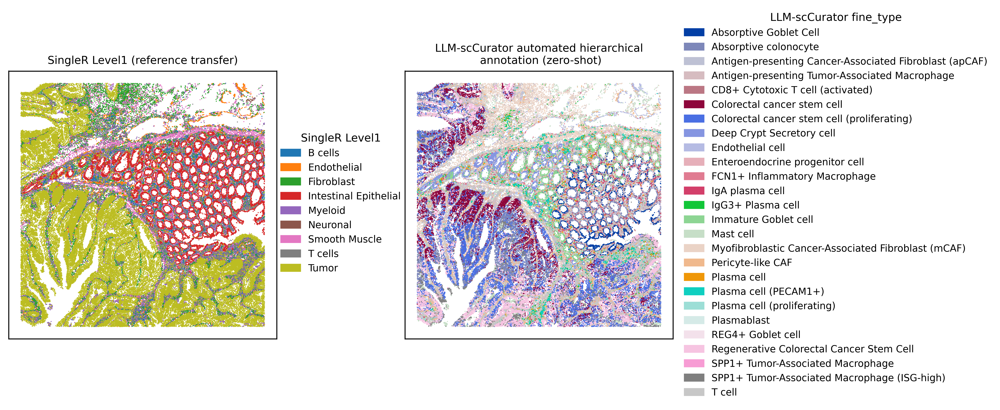

Saved to:
/runs/20251201.v1/Fig2e_Xenium_L1_vs_LLMsc_finetype.png
/runs/20251201.v1/Fig2e_Xenium_L1_vs_LLMsc_finetype.pdf


In [ ]:
# ------------------------------------------------
# 0. Unify fine_type labels
# ------------------------------------------------
if "fine_type" in adata_llm.obs.columns:
    ft = adata_llm.obs["fine_type"].astype(str)
    ft = ft.replace({"Absorptive Colonocyte": "Absorptive colonocyte"})
    adata_llm.obs["fine_type"] = ft.astype("category")

    fine_cats = adata_llm.obs["fine_type"].cat.categories
    adata_llm.uns["fine_type_colors"] = default_28[: len(fine_cats)]

# ------------------------------------------------
# 1. Copy the coordinates to obs
# ------------------------------------------------
adata_llm.obs["x"] = adata_llm.obsm["spatial"][:, 0]
adata_llm.obs["y"] = adata_llm.obsm["spatial"][:, 1]

# ------------------------------------------------
# 2. Prepare the diagram and axes
# ------------------------------------------------
fig, axes = plt.subplots(
    1, 2,
    figsize=(11, 4),
    dpi=600,
    sharex=True,
    sharey=True,
)

titles = [
    "SingleR Level1 (reference transfer)",
    "LLM-scCurator automated hierarchical\n annotation (zero-shot)",
]

# ------------------------------------------------
# 3. Main Plot（Scanpy）
# ------------------------------------------------
for ax, col, title in zip(
    axes,
    ["Level1", "fine_type"],
    titles,
):
    sc.pl.scatter(
        adata_llm,
        x="x",
        y="y",
        color=col,
        ax=ax,
        size=3,
        show=False,
        legend_loc="none",
    )
    ax.invert_yaxis()
    ax.set_title(title, fontsize=9)

    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")

# ------------------------------------------------
# 4. SingleR Level 1 Legend
# ------------------------------------------------
level1_cat = adata_llm.obs["Level1"].astype("category")
level1_cats = level1_cat.cat.categories

level1_colors = adata_llm.uns.get("Level1_colors", None)
if level1_colors is None or len(level1_colors) < len(level1_cats):
    level1_colors = default_20[: len(level1_cats)]
else:
    level1_colors = level1_colors[: len(level1_cats)]

handles_l1 = [
    Patch(color=c, label=lab)
    for lab, c in zip(level1_cats, level1_colors)
]

fig.legend(
    handles=handles_l1,
    title="SingleR Level1",
    loc="center",
    bbox_to_anchor=(0.415, 0.5),
    bbox_transform=fig.transFigure,
    ncol=1,
    fontsize=8,
    title_fontsize=9,
    frameon=False,
)

# ------------------------------------------------
# 5. Legend for LLM-scCurator (fine_type)
# ------------------------------------------------
fine_cat = adata_llm.obs["fine_type"].astype("category")
fine_cats = fine_cat.cat.categories

fine_colors = adata_llm.uns.get("fine_type_colors", None)
if fine_colors is None or len(fine_colors) < len(fine_cats):
    fine_colors = default_28[: len(fine_cats)]
else:
    fine_colors = fine_colors[: len(fine_cats)]

handles_fine = [
    Patch(color=c, label=lab)
    for lab, c in zip(fine_cats, fine_colors)
]

axes[1].legend(
    handles=handles_fine,
    title="LLM-scCurator fine_type",
    loc="center left",
    bbox_to_anchor=(1.01, 0.5),
    ncol=1,
    fontsize=8,
    title_fontsize=9,
    frameon=False,
)

# ------------------------------------------------
# 6. Layout Adjustment & Save
# ------------------------------------------------
fig.subplots_adjust(left=0.05, right=0.78, wspace=0.31)

png_path = os.path.join(OUT_DIR, "Fig2e_Xenium_L1_vs_LLMsc_finetype.png")
pdf_path = os.path.join(OUT_DIR, "Fig2e_Xenium_L1_vs_LLMsc_finetype.pdf")

fig.savefig(png_path, dpi=600, bbox_inches="tight")
fig.savefig(pdf_path, bbox_inches="tight")

plt.show()

print("Saved to:")
print(png_path)
print(pdf_path)

In [ ]:
anno_df = adata_llm.obs[["fine_type"]].copy()
anno_df.index.name = "cell_id"   # I want to use it as a bank name on the R side.

csv_path = os.path.join(OUT_DIR, "xenium_llmsc_finetype.csv")
anno_df.to_csv(csv_path)

print("LLM-scCurator annotation written to:")
print(csv_path)


LLM-scCurator annotation written to:
/runs/20251201.v1/xenium_llmsc_finetype.csv


In [ ]:
%%R
# --- 2-1. Reading CSV files exported from Python ---
llm_anno <- read.csv(
  "/runs/20251201.v1/xenium_llmsc_finetype.csv",
  row.names = 1,
  check.names = FALSE
)

# --- 2-2. Sort by cell_id and map to sub ---
llm_anno <- llm_anno[colnames(sub), , drop = FALSE]

# Add as a new column
sub$LLMsc_fine <- factor(llm_anno$fine_type)
table(sub$LLMsc_fine)


                                  Absorptive colonocyte 
                                                   7898 
                                 Absorptive Goblet Cell 
                                                   3350 
Antigen-presenting Cancer-Associated Fibroblast (apCAF) 
                                                   3461 
         Antigen-presenting Tumor-Associated Macrophage 
                                                   6966 
                      CD8+ Cytotoxic T cell (activated) 
                                                   1522 
                            Colorectal cancer stem cell 
                                                   9197 
            Colorectal cancer stem cell (proliferating) 
                                                  10910 
                              Deep Crypt Secretory cell 
                                                   2454 
                                       Endothelial cell 
                              

Final heatmap generated at: /runs/20251201.v1 


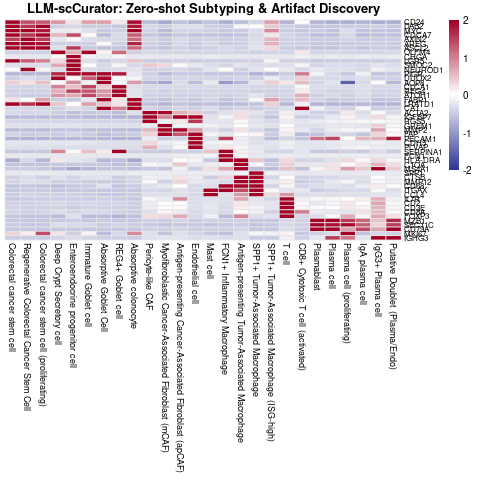

In [ ]:
%%R
# ============================
# 1. Data Preparation
# ============================

# --- Class Name Replacement ---
levels(sub$LLMsc_fine)[levels(sub$LLMsc_fine) == "Plasma cell (PECAM1+)"] <- "Putative Doublet (Plasma/Endo)"

# Redefining Class Order (Rename Support)
lvl_order <- c(
  # --- Epithelial Niche (Crypt base -> Top) ---
  "Colorectal cancer stem cell",
  "Regenerative Colorectal Cancer Stem Cell",
  "Colorectal cancer stem cell (proliferating)",
  "Deep Crypt Secretory cell",
  "Enteroendocrine progenitor cell",
  "Immature Goblet cell",
  "Absorptive Goblet Cell",
  "REG4+ Goblet cell",
  "Absorptive colonocyte",

  # --- Stromal ---
  "Pericyte-like CAF",
  "Myofibroblastic Cancer-Associated Fibroblast (mCAF)",
  "Antigen-presenting Cancer-Associated Fibroblast (apCAF)",
  "Endothelial cell",

  # --- Immune ---
  "Mast cell",
  "FCN1+ Inflammatory Macrophage",
  "Antigen-presenting Tumor-Associated Macrophage",
  "SPP1+ Tumor-Associated Macrophage",
  "SPP1+ Tumor-Associated Macrophage (ISG-high)",
  "T cell",
  "CD8+ Cytotoxic T cell (activated)",

  # --- B / Plasma ---
  "Plasmablast",
  "Plasma cell",
  "Plasma cell (proliferating)",
  "IgA plasma cell",
  "IgG3+ Plasma cell",

  # --- The "Curator's Trophy" ---
  "Putative Doublet (Plasma/Endo)"
)

# Extract only the existing levels and factorize them
existing_levels <- intersect(lvl_order, unique(sub$LLMsc_fine))
sub$LLMsc_fine <- factor(sub$LLMsc_fine, levels = existing_levels)

# ============================
# 2. Refined Marker Strategy (Noise Reduction and Signal Enhancement)
# ============================

# A. Canonical
# Deliberately excluding general epithelial markers (such as CEACAM) and rigorously selecting highly specific ones
canonical_genes <- c(
  # Stem / Cycling (最重要)
  "LGR5", "OLFM4", "ASCL2", "AXIN2", "SMOC2", "MKI67", "TOP2A",
  # Secretory / Goblet
  "MUC2", "SPINK4", "REG4", "ATOH1", "NEUROD1", "CHGA",
  # Absorptive (Differentiation marker)
  "KRT20", "FABP1", "CA1", "AQP8",
  # Stromal / Endo
  "COL1A1", "FAP", "ACTA2", "RGS5", "GREM1", "PECAM1", "PLVAP",
  # Myeloid
  "CD68", "SPP1", "C1QA", "FCN1", "S100A8", "TPSAB1",
  # T / NK
  "CD3E", "CD8A", "FOXP3", "GZMB", "CCL4", "IL7R",
  # B / Plasma
  "CD79A", "MS4A1", "JCHAIN", "MZB1", "IGHA1", "IGHG3"
)

# B. Data-Driven Marker (Complement)
# Blacklist and exclude CEACAM family and mitochondria
blacklist <- c("CEACAM5", "CEACAM6", "GPX2", "MALAT1", "NEAT1", "KRT8", "KRT18")

mgs_llm <- findMarkers(sub, groups = sub$LLMsc_fine, direction = "up", pval.type = "any")
top_data_driven <- lapply(names(mgs_llm), function(nm) {
  df <- as.data.frame(mgs_llm[[nm]])
  df <- df[order(df$p.value), ]
  g <- rownames(df)
  # Blacklist Exclusion
  g <- g[!g %in% blacklist]
  g <- g[!grepl("^(MT-|RPL|RPS)", g)]
  head(g, 2) # Only the top 2 in each class
})
all_data_driven <- unique(unlist(top_data_driven))

# C. Integration
final_panel <- unique(c(intersect(canonical_genes, rownames(sub)), all_data_driven))

# ============================
# 3. Matrix Creation & Sorting
# ============================
lc <- logcounts(sub)[final_panel, , drop = FALSE]
classes    <- droplevels(sub$LLMsc_fine)
cls_levels <- levels(classes)

# Pseudo-bulk Matrix
mat <- sapply(cls_levels, function(cl) {
  idx <- which(classes == cl)
  if (length(idx) == 0L) return(rep(NA, nrow(lc)))
  # Verification of Matrix Format and Average Calculation
  val <- if (inherits(lc, "dgCMatrix")) Matrix::rowMeans(lc[, idx, drop = FALSE]) else rowMeans(lc[, idx, drop = FALSE])
  return(val)
})
rownames(mat) <- final_panel
colnames(mat) <- cls_levels

peak_class_idx <- apply(mat, 1, which.max)
ord <- order(peak_class_idx, -apply(mat, 1, max))
marker_ordered <- rownames(mat)[ord]

# ============================
# 4. Plotting
# ============================

pdf(file.path(out_dir, "EDFig3c_Xenium_HumanColon_Oliveira.pdf"), width = 7, height = 9)

pheatmap(
  mat[marker_ordered, ],
  scale = "row",
  cluster_rows = FALSE,
  cluster_cols = FALSE,
  show_colnames = TRUE,
  fontsize_row = 8,
  fontsize_col = 9,
  color = colorRampPalette(c("#313695", "white", "#a50026"))(100),
  breaks = seq(-2, 2, length.out = 101),
  treeheight_row = 0, treeheight_col = 0,
  border_color = "grey90",
  main = "LLM-scCurator: Zero-shot Subtyping & Artifact Discovery"
)
dev.off()


cat("Final heatmap generated at:", out_dir, "\n")